## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, Load the required libraray

In [2]:
import numpy as np
import cv2
import glob
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
%matplotlib inline

## Then, I'll compute the camera calibration using chessboard images

The goal is to get the calibration matrix and distortion coefficients.

* a set of chessboard image are given.

---

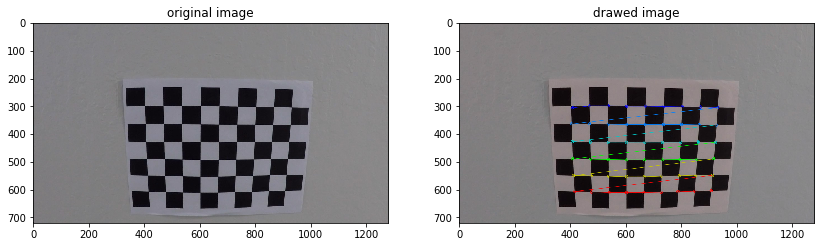

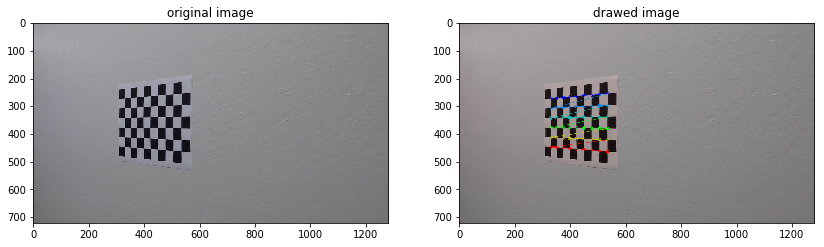

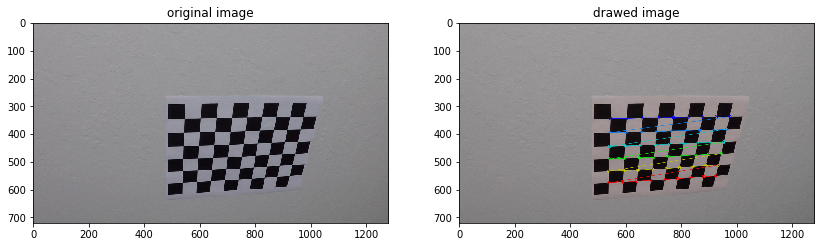

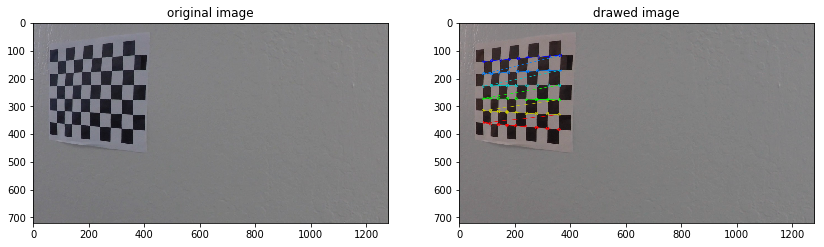

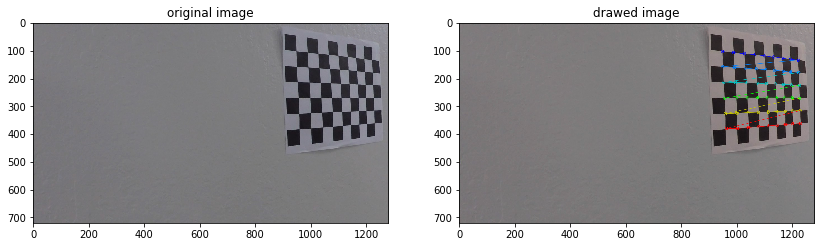

...

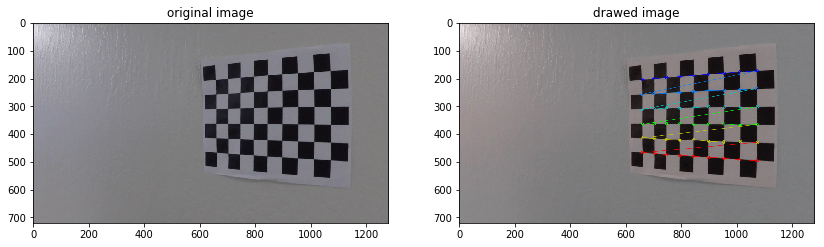

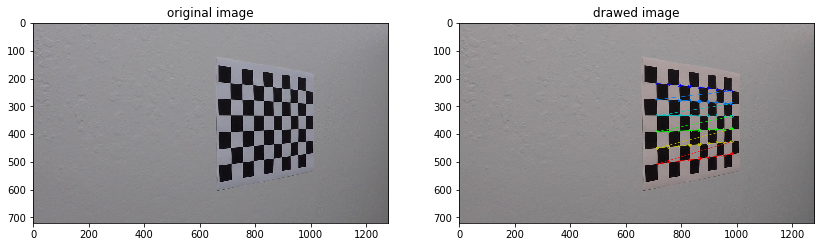

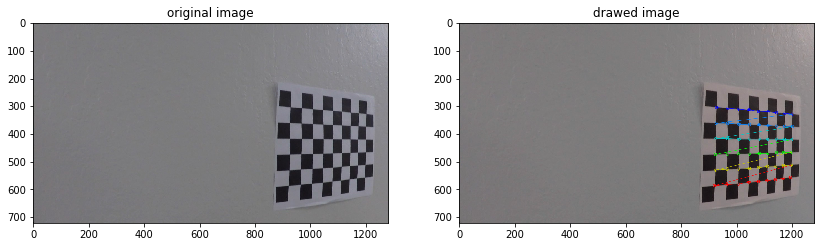

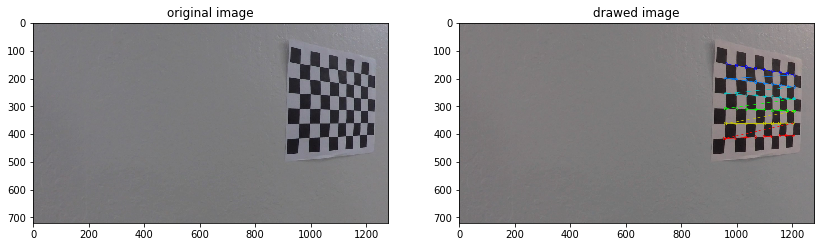

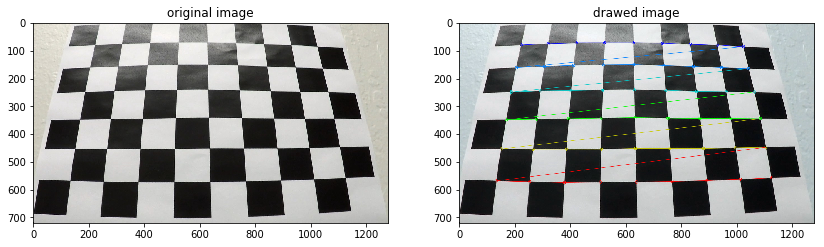

In [3]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space.
imgpoints = [] # 2d points in image plane.

# Define a function that undistort the image
def undistort_image(img, objpoints, imgpoints):
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    undistort = cv2.undistort(img, mtx, dist, None, mtx)
    return undistort
    
# Make a list of calibration images
images = glob.glob('../CarND-Advanced-Lane-Lines/camera_cal/calibration*.jpg')  #pass a possible string in this function return a list of names

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)
    
    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (9,6), corners, ret)
        f, (ax1, ax2) = plt.subplots(1,2, figsize = (14,8))
        ax1.imshow(mpimg.imread(fname))
        ax1.set_title("original image")
        ax2.imshow(img)
        ax2.set_title("drawed image")

## Show the original and the undistorted image blow

In [4]:
# def undistort_all(image):
    
#     objp = np.zeros((6*9,3), np.float32)
#     objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)
    
#     ret, corner = cv2.findChessboardCorners(cv2.cvtColor(image,cv2.COLOR_RGB2GRAY),(9,6),None)
    
#     if ret == True:
#         img = cv2.imread(image)
#         imsize = img.shape
#         ret, dist, mtx, rvecs, tvecs = cv2.calibrateCamera(objp, corner, imsize, None)
#         undistort = cv2.undistort(img, mtx, dist, None, mtx)
        
#     return undistort
        
       

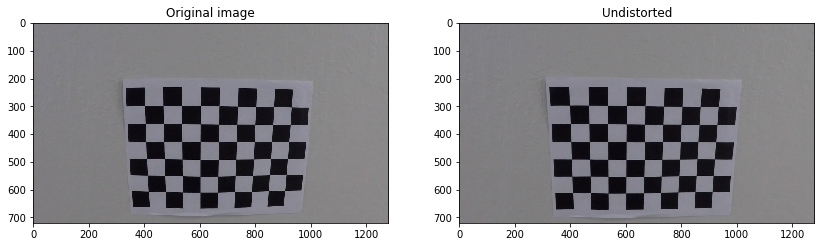

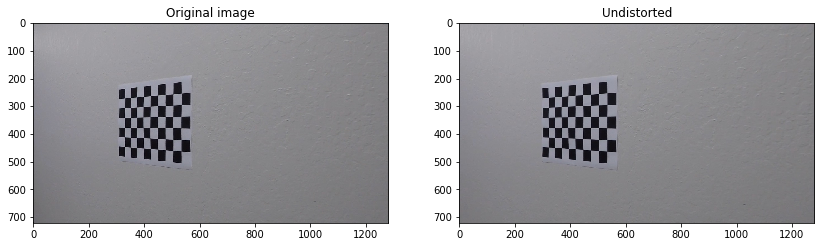

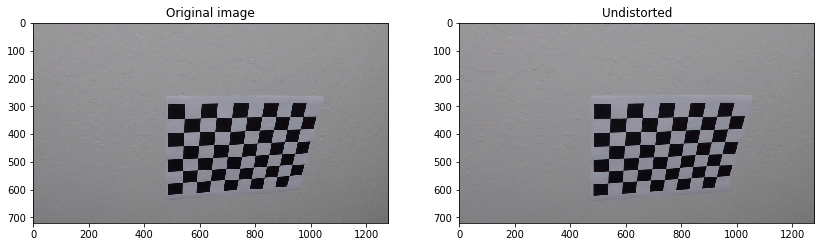

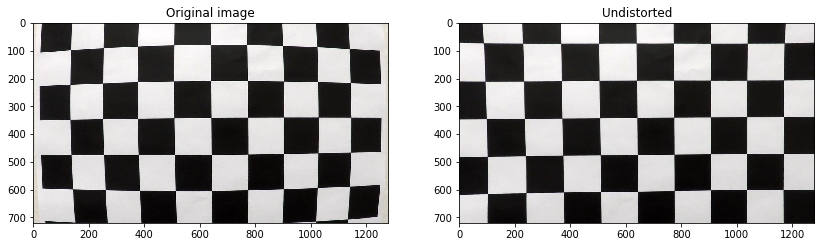

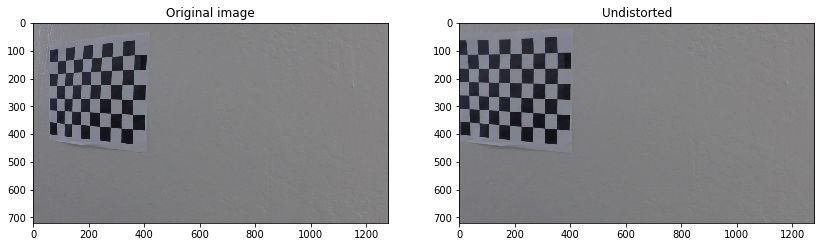

...

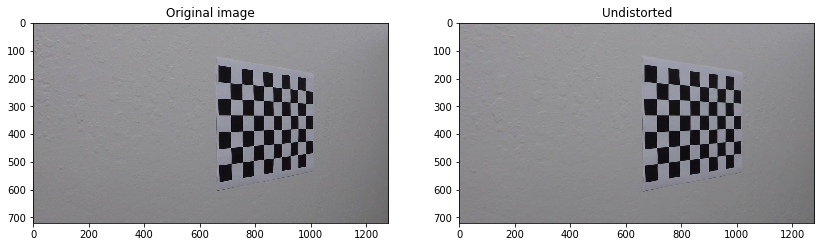

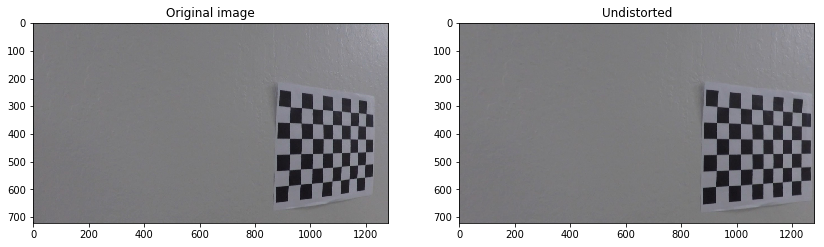

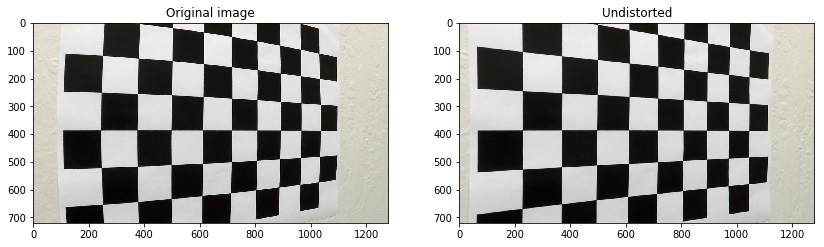

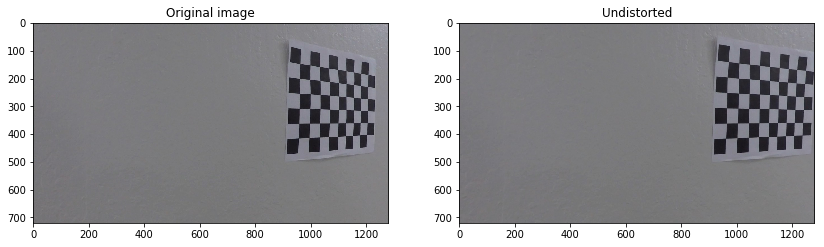

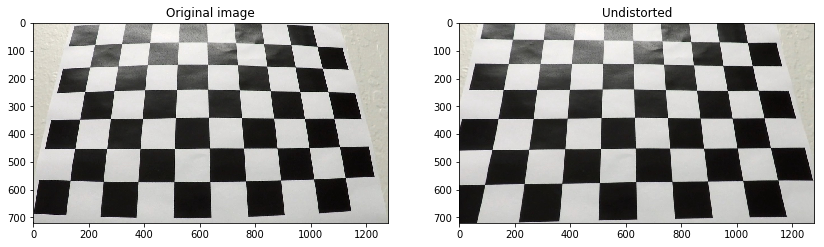

In [5]:
for fname in images:
    f, (ax1, ax2) = plt.subplots(1, 2, figsize = (14,8))
    ax1.imshow(mpimg.imread(fname))
    ax1.set_title("Original image")
    undistort = undistort_image(mpimg.imread(fname), objpoints, imgpoints)
    ax2.imshow(undistort)
    ax2.set_title("Undistorted")

## Binary Image

In this step, choose to find the best filter to select the yellow and white lane on the road image. here i found some useful 
information about how to choose the color space and the corresponding filters.

* The S Channel from the HLS color space, with a min threshold of 180 and a max threshold of 255, did a fairly good job of identifying both the white and yellow lane lines, but did not pick up 100% of the pixels in either one, and had a tendency to get distracted by shadows on the road.
* The L Channel from the LUV color space, with a min threshold of 225 and a max threshold of 255, did an almost perfect job of picking up the white lane lines, but completely ignored the yellow lines.
* The B channel from the Lab color space, with a min threshold of 155 and an upper threshold of 200, did a better job than the S channel in identifying the yellow lines, but completely ignored the white lines. 

In [6]:
def sobel_x(img, threhold= [230,255]):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    sobelx = cv2.Sobel(gray,  cv2.CV_64F,1,0)
    scaled_sobelx = np.uint8(255*sobelx/np.max(sobelx))
    binary_sobelx = np.zeros_like(gray)
    binary_sobelx[(scaled_sobelx > threhold[0])&(scaled_sobelx<threhold[1])] = 1
    
    return binary_sobelx

In [7]:
def sobel_y(img, threhold = [35,255]):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    sobely = cv2.Sobel(gray, cv2.CV_64F,0,1)
    sobely_scaled = np.uint8(255*sobely/np.max(sobely))
    binary_sobely = np.zeros_like(gray)
    binary_sobely[(sobely_scaled > threhold[0])&(sobely_scaled<threhold[1])] = 1
    
    return binary_sobely

In [8]:
def sobel_mag(img, threhold = [60,255]):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F,1,0)
    sobely = cv2.Sobel(gray, cv2.CV_64F,0,1)
    sobel = np.sqrt(sobelx**2+sobely**2)
    sobel_scaled = np.uint8(255*sobel/np.max(sobel))
    binary_sobel = np.zeros_like(gray)
    binary_sobel[(sobel_scaled < threhold[1])&(sobel_scaled>threhold[0])] = 1
    
    return binary_sobel

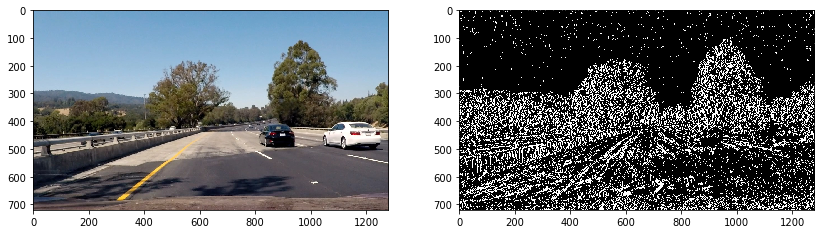

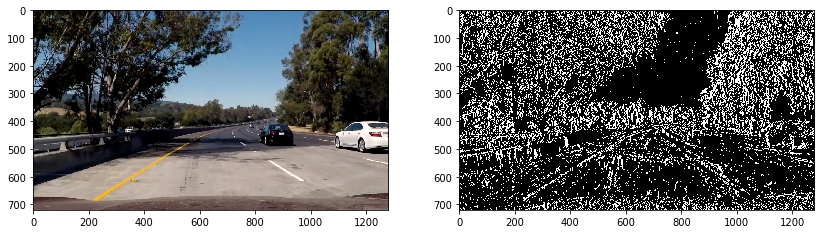

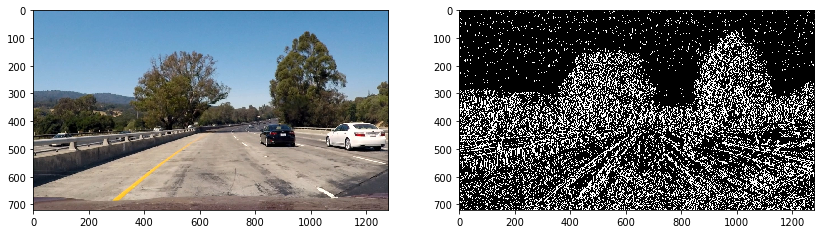

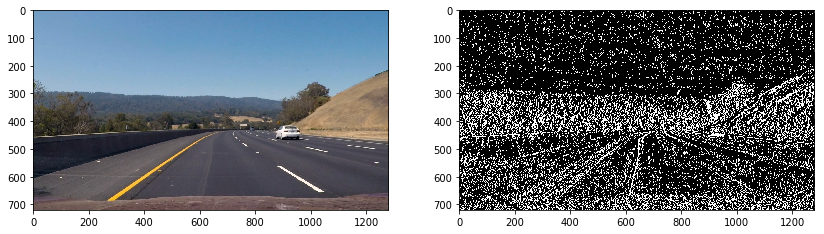

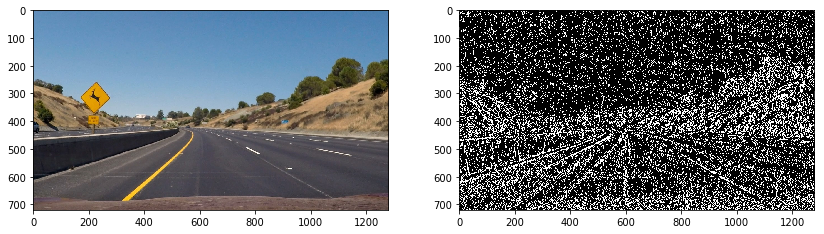

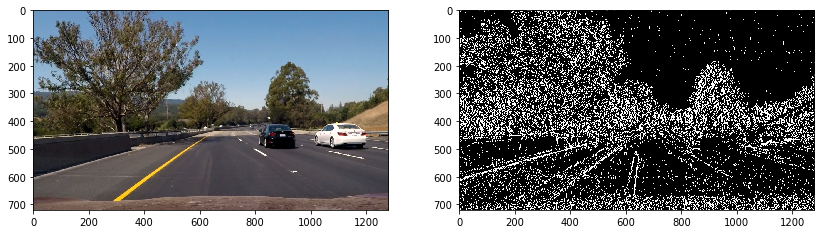

In [9]:
scenarios = glob.glob('../CarND-Advanced-Lane-Lines/test_images/test*.jpg')
for image in scenarios:
    f, (ax1, ax2) = plt.subplots(1, 2, figsize = (14,9))
    ax1.imshow(mpimg.imread(image))
    ax2.imshow(sobel_x(cv2.imread(image)),cmap = 'gray')

In [10]:
def sobel_dirc(img, threhold = [0.7,1.1]):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F,1,0)
    sobely = cv2.Sobel(gray, cv2.CV_64F,0,1)
    sobel_dirc = np.arctan2(np.absolute(sobely),np.absolute(sobelx))
#     sobel_dirc_scaled = np.uint8(sobel_dirc*255/np.max(sobel_dirc))
    binary_sobel = np.zeros_like(gray)
    binary_sobel[(sobel_dirc < threhold[1]) & (sobel_dirc > threhold[0])] = 1
    
    return binary_sobel

In [11]:
def Colorspace_threhold(img, s_threhold =[160,255], v_threhold =[160,255]):
    
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
#     lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    
    s_channel = hls[:,:,2]
    v_channel = hsv[:,:,2]
    
    binary_color = np.zeros_like(s_channel)
    binary_color[(s_channel>s_threhold[0])&(s_channel<s_threhold[1])&(v_channel>v_threhold[0])&(v_channel<v_threhold[1])] = 1
    
    return binary_color

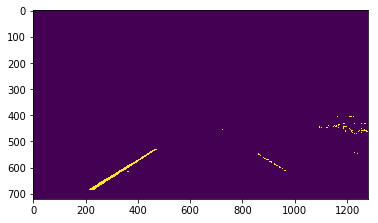

In [12]:
def HLS_Color_Gradient(img):
    
#     image = cv2.imread(img)
    sobelx = sobel_x(img)
    sobely = sobel_y(img)
    sobel = sobel_mag(img)
    dirc = sobel_dirc(img)
    colorspace = Colorspace_threhold(img)
#     hls = cv2.cvtColor(image, cv2.COLOR_BGR2HLS)
#     l_image = hls[:,:,1]
#     s_image = hls[:,:,2]
    
#     sobelx = cv2.Sobel(l_image, cv2.CV_64F, 1, 0)
#     sobely = cv2.Sobel(l_image, cv2.CV_64F, 0, 1)
#     sobel_all = np.sqrt(sobelx**2+sobely**2)
#     scaled_sobel = np.uint8(255*sobel_all/np.max(sobel_all))
#     binary_sobel = np.zeros_like(l_image)
#     binary_sobel[(sobel_all>sobel_threhold[0])&(sobel_all<sobel_threhold[1])] = 1 #这里一定要加括号
    
    HLS_binary = np.zeros_like(sobelx)
#     s_binary[(s_image>s_threhold[0])&(s_image<s_threhold[1])] = 1
    
    #dstack() takes 1 positional argument!
    HLS_binary[((sobelx == 1)&(sobely == 1)&(sobel ==1)) | (colorspace ==1)|((sobel ==1)&(dirc ==1)) ] = 255
    
    return HLS_binary

plt.imshow(Colorspace_threhold(mpimg.imread(scenarios[1])))

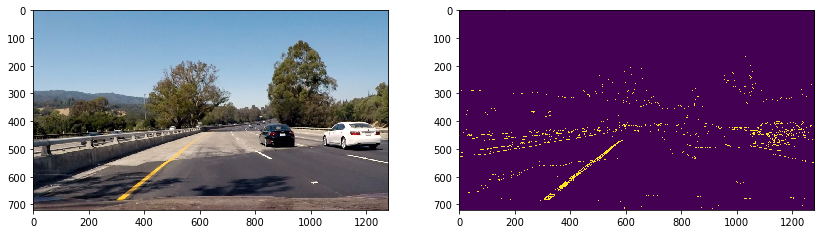

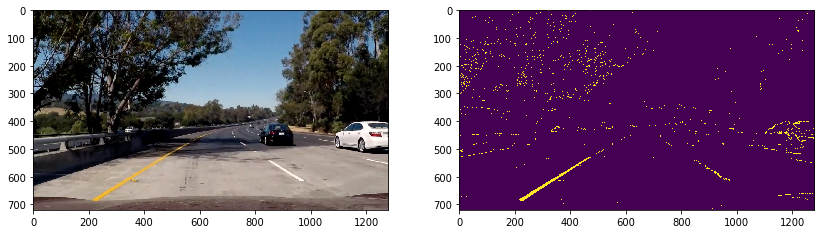

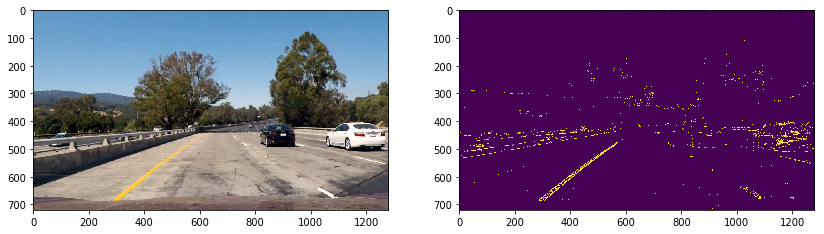

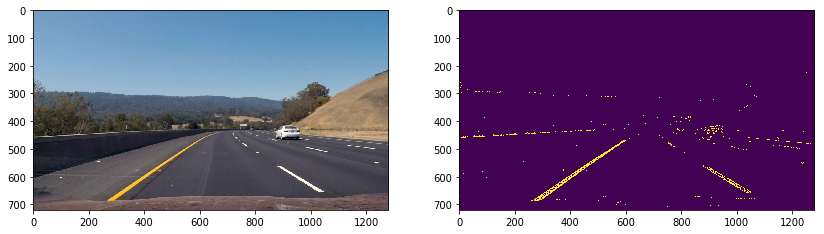

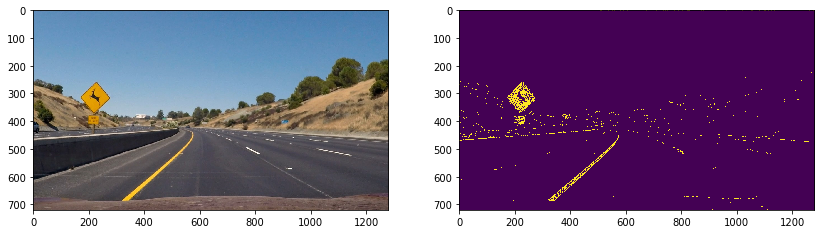

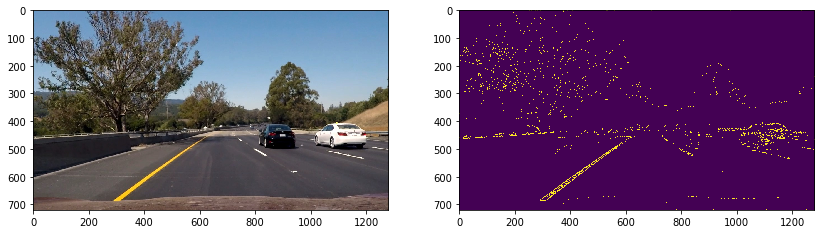

In [13]:
scenarios = glob.glob('../CarND-Advanced-Lane-Lines/test_images/test*.jpg')

for image in scenarios:
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize = (14,10))
    ax1.imshow(mpimg.imread(image))
    ax2.imshow(HLS_Color_Gradient(cv2.imread(image)))

## Perspective Transform

In [14]:
def Perspective_trans(img):
    imshape = img.shape
    offset = 0
    src = np.array([[(imshape[1]*0.42,imshape[0]*0.65),(imshape[1]*0.58,imshape[0]*0.65),(imshape[1],imshape[0]),(0,imshape[0])]],dtype=np.float32)
    dst = np.array([[(offset,offset),(imshape[1]-offset,offset),(imshape[1]-offset,imshape[0]-offset),(offset,imshape[0]-offset)]],dtype=np.float32)
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped_image = cv2.warpPerspective(img, M, (imshape[1],imshape[0]), flags = cv2.INTER_LINEAR)
    
    return warped_image

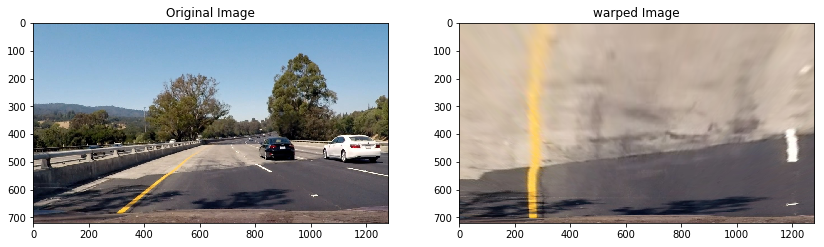

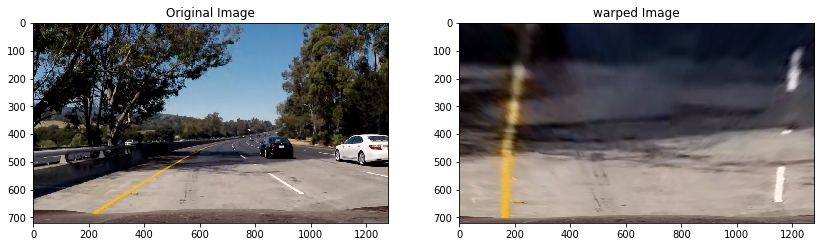

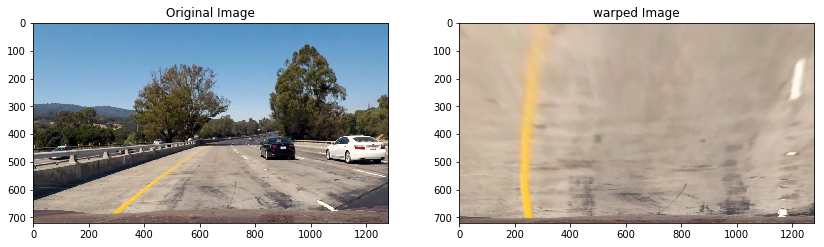

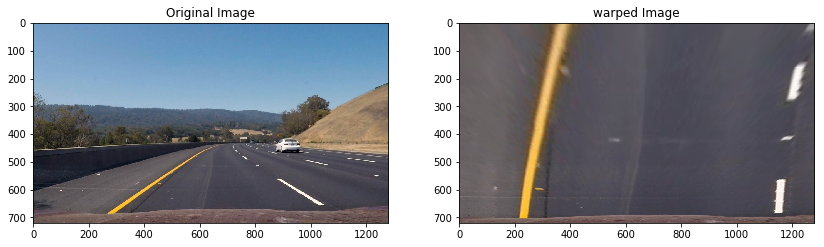

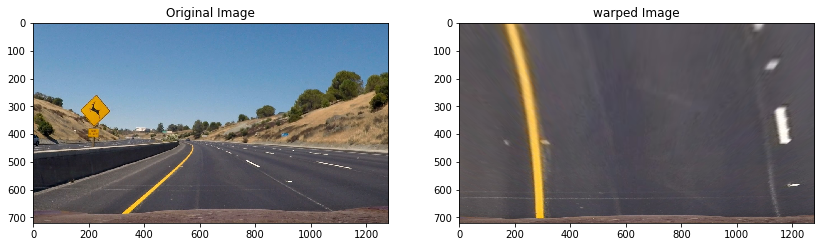

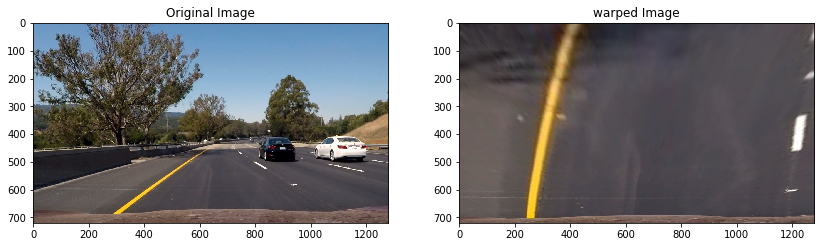

In [15]:
for image in scenarios:
    f, (ax1, ax2) = plt.subplots(1, 2, figsize = (14, 9))
    ax1.imshow(mpimg.imread(image))
    ax1.set_title("Original Image")
    ax2.imshow(Perspective_trans(mpimg.imread(image)))
    ax2.set_title("warped Image")

## Combine the perspective transform with the color threhold filter

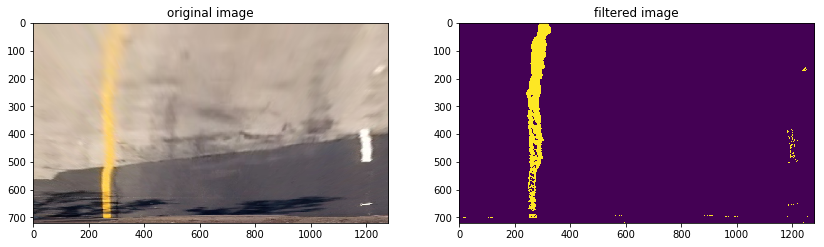

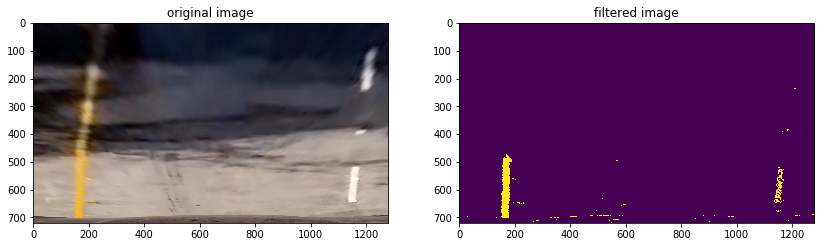

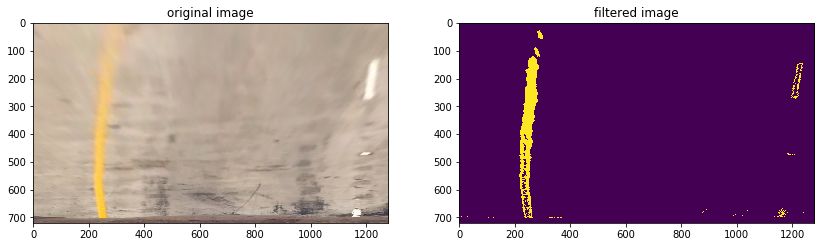

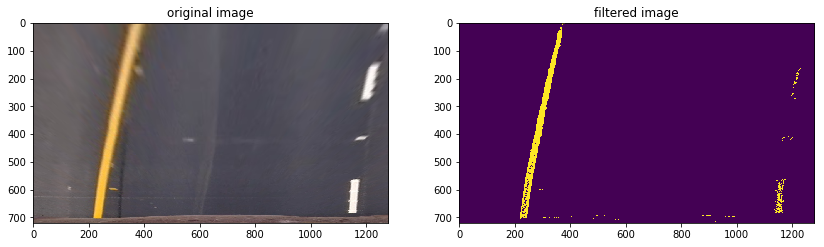

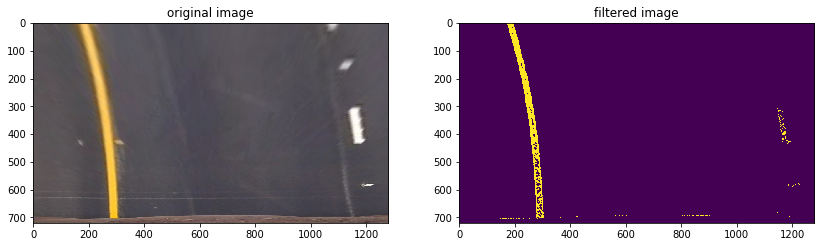

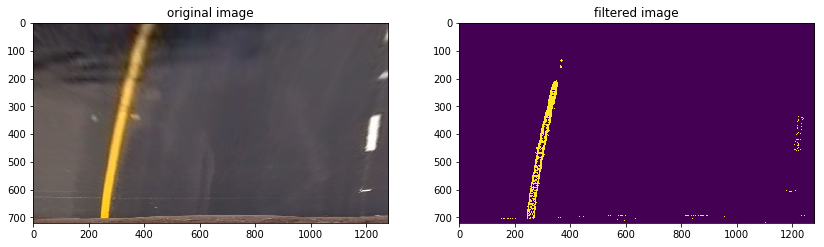

In [51]:
for image in scenarios:
    warped = Perspective_trans(mpimg.imread(image))
    hls = HLS_Color_Gradient(warped)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize = (14,9))
    ax1.imshow(warped)
    ax1.set_title('original image')
    ax2.imshow(HLS_Color_Gradient(warped))
    ax2.set_title('filtered image')
    

## Using the sliding window to pass the detected lane and calculate the curvature

In [72]:
def sliding_wins(warped):
    

    histo = np.sum(warped[warped.shape[0]//2:, :], axis = 0)
    out_img = np.dstack((warped,warped,warped))
    print(histo.shape)
    print(warped.shape)
    midpoint = np.int(histo.shape[0]//2)
    print(midpoint)
    leftx_base = np.argmax(histo[:midpoint])
    rightx_base = np.argmax(histo[midpoint:]) + midpoint
    print(rightx_base)
    #set the hyperparameter to determine the size of the windows
    nwindows = 9
    min_pixel = 50
    margin = 100
    
    window_height = np.int(warped.shape[0]//nwindows)
    
    nonzero = warped.nonzero()
    nonzerox = np.array(nonzero[1])
    nonzeroy = np.array(nonzero[0])
    
    left_current = leftx_base
    right_current = rightx_base
   
    
    left_lane_index = []
    right_lane_index = []
    
    for window in range(nwindows):
        
        window_y_high = warped.shape[0] - window*window_height
        window_y_low = warped.shape[0] - (window+1)*window_height
        window_leftx_low = left_current - margin
        window_leftx_high = left_current + margin
        window_rightx_low = right_current - margin
        window_rightx_high = right_current + margin
        print("window_rightx_high",window_rightx_high)
        print("window_leftx_low",window_leftx_low)
   
        cv2.rectangle(out_img,(window_leftx_low, window_y_low),
                      (window_leftx_high, window_y_high), (0,255,0), 2)
        cv2.rectangle(out_img,(window_rightx_low, window_y_low),
                      (window_rightx_high, window_y_high), (0,255,0), 2)
        
        left_inwindow_index = ((nonzerox>=window_leftx_low)&(nonzerox<window_leftx_high)&
        (nonzeroy<window_y_high)&(nonzeroy>window_y_low)).nonzero()[0]
        right_inwindow_index = ((nonzerox>=window_rightx_low)&(nonzerox<window_rightx_high)&
        (nonzeroy<window_y_high)&(nonzeroy>window_y_low)).nonzero()[0]

        
        left_lane_index.append(left_inwindow_index)
        right_lane_index.append(right_inwindow_index)
        
        if len(left_inwindow_index) > min_pixel:
            left_current = np.int(np.mean(nonzerox[left_inwindow_index]))
        if len(right_inwindow_index) > min_pixel:        
            right_current = np.int(np.mean(nonzerox[right_inwindow_index]))

    try:
        left_lane_index = np.concatenate(left_lane_index)
        right_lane_index = np.concatenate(right_lane_index)
    except ValueError:
        
        pass

    leftx = nonzerox[left_lane_index]
    rightx = nonzerox[right_lane_index]
    lefty = nonzeroy[left_lane_index]
    righty = nonzeroy[right_lane_index]
        
        
    return leftx, rightx, lefty, righty, out_img


(1280,)
(720, 1280)
640
1191
window_rightx_high 1291
window_leftx_low 156
window_rightx_high 1283
window_leftx_low 164
window_rightx_high 1283
window_leftx_low 162
window_rightx_high 1300
window_leftx_low 171
window_rightx_high 1296
window_leftx_low 175
window_rightx_high 1290
window_leftx_low 171
window_rightx_high 1290
window_leftx_low 167
window_rightx_high 1341
window_leftx_low 175
window_rightx_high 1341
window_leftx_low 184
(1280,)
(720, 1280)
640
1148
window_rightx_high 1248
window_leftx_low 71
window_rightx_high 1269
window_leftx_low 70
window_rightx_high 1250
window_leftx_low 68
window_rightx_high 1255
window_leftx_low 70
window_rightx_high 1255
window_leftx_low 71
window_rightx_high 1255
window_leftx_low 71
window_rightx_high 1255
window_leftx_low 71
window_rightx_high 1255
window_leftx_low 71
window_rightx_high 1255
window_leftx_low 71
(1280,)
(720, 1280)
640
1163
window_rightx_high 1263
window_leftx_low 150
window_rightx_high 1269
window_leftx_low 149
window_rightx_high 126

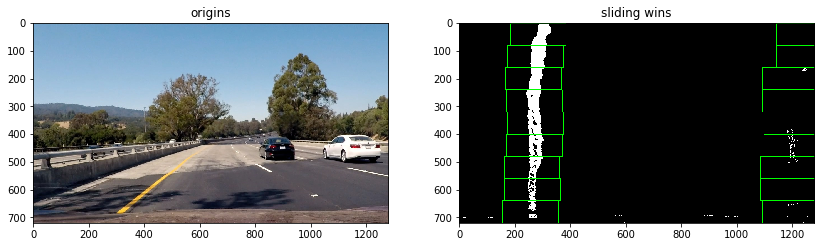

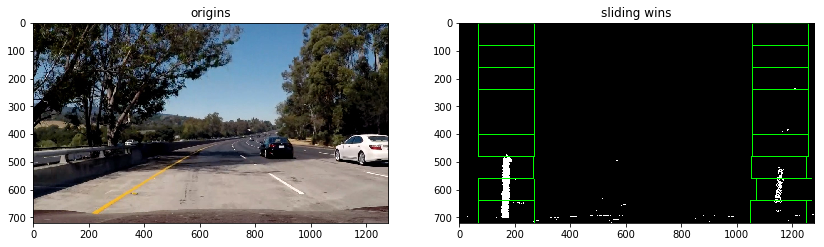

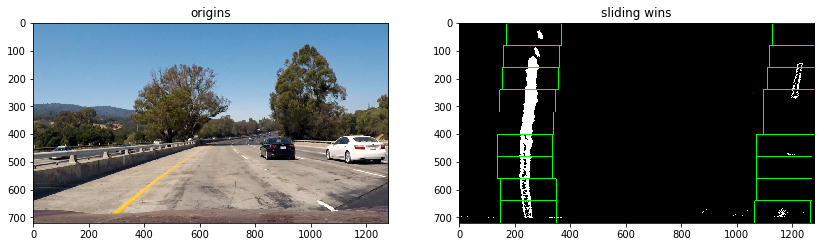

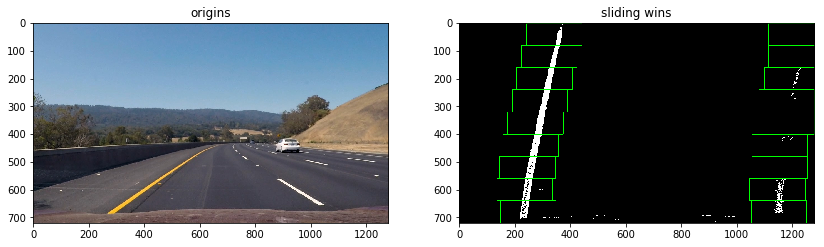

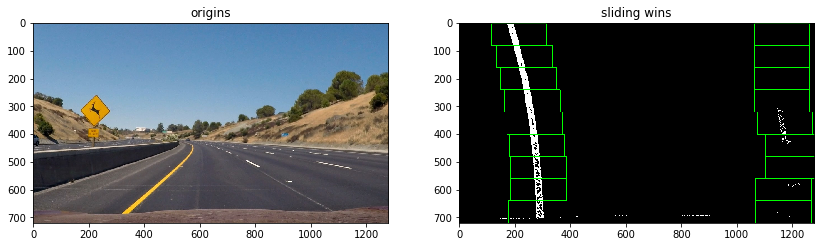

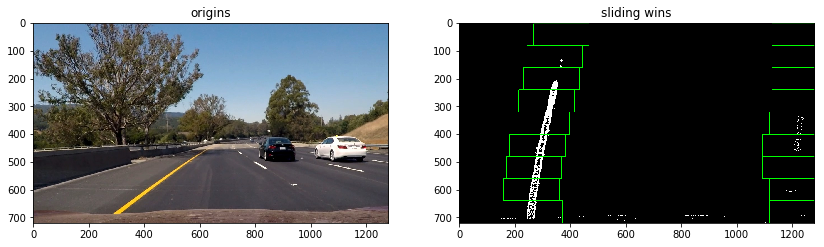

In [73]:
np.set_printoptions(threshold=np.inf)
for image in scenarios:
    pers = Perspective_trans(mpimg.imread(image))
    filtered = HLS_Color_Gradient(pers)
    leftx, rightx, lefty, righty, outimg = sliding_wins(filtered)
    f, (ax1,ax2) = plt.subplots(1,2,figsize = (14,9))
    ax1.imshow(mpimg.imread(image))
    ax1.set_title('origins')
    ax2.imshow(outimg)
    ax2.set_title('sliding wins')

In [ ]:
def fit_poly(warped):
    
    leftx, rightx, lefty, righty, out_img = sliding_wins(warped)
    
    left_poly = np.polyfit(lefty, leftx, 2)
    right_poly = np.polyfit(righty, rightx, 2)
    
    ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0])
    
    try:
        plotx_left = left_poly[0]*ploty**2 + left_poly[1]*ploty + left_poly[2]
        plotx_right = right_poly[0]*ploty**2 + right_poly[1]*ploty + right_poly[2]
    except TypeError:
        pass
    
    #visualisierung:这里分两层  一是把active的 像素点染色 二是把 poly 在图上plot出来
    
    out_img[leftx, lefty] = [255, 0, 0]
    out_img[rightx, righty] =[0, 0, 255]
    
    plt.poly(out_img, plotx_left, ploty, color = "yellow")
    plt.poly(out_img, plotx_right, ploty, color = "yellow")
    
    return out_img

In [ ]:
def detect_ploy_new(binary_warped):
    
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Plot the polynomial lines onto the image
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    ## End visualization steps ##
    
    return result

## Detect the Lane pixel and try to find lane boundary

* probably i should write a Lane class to store the different value of the Lane
* what should i in this lane class write? which function i should define in the lane class

In [11]:
a =np.array([0,0,0,1,3,4,5,6,7,8,0])
print(a.nonzero())

(array([3, 4, 5, 6, 7, 8, 9]),)


In [ ]:
class Lane():

    def Lane_detect(img):